# ParD antitoxin empirical landscape

In the following tutorial we will analyze the topography of a 3 aminoacid long landscape based on protein protein interaction between mutant sequences at ParD3 with two cognate toxins ParE2 and ParE3

# 1. Obtaining estimates for every possible sequence from incomplete experimental data

In contrast to theoretical or toy landscapes, empirical landscapes that are based on experimental data is noisy and incomplete, so we need to apply additional methods before we have estimates for every gentoype of interest to visualize the structure of the fitness landscape.

We provide a simple interface to perform Variance Component regression. Briefly, VC regression uses the empirical data to estimate a prior to perform Gaussian Process regression on functions over sequence space characterized by the contribution of the different orders of interaction to the sequence-dependent variability in the data. Then, we can estimate and predict the phenotype at every possible sequence assuming that the prior is still valid in regions of sequence space or genotypes that have not been experimentally measured

## Preparing the data

In [85]:
# Import required libraries
import pandas as pd
import numpy as np
import seaborn as sns
import holoviews as hv

import gpmap.src.plot as plot

from gpmap.inference import VCregression
from gpmap.src.space import SequenceSpace
from gpmap.src.randwalk import WMWSWalk
from gpmap.src.genotypes import select_genotypes
from gpmap.src.seq import translate_seqs

In [2]:
fpath = '../gpmap/test/data/GSE153897_Variant_frequency.csv'
data = pd.read_csv(fpath, index_col=0)
data.head()

,ParE3_rep1_t0,ParE2_rep1_t0,ParE3_rep2_t0,ParE2_rep2_t0,ParE3_rep1_t600,ParE2_rep1_t600,ParE3_rep2_t600,ParE2_rep2_t600
AAA,0.000091,0.000075,0.000086,0.000076,0.000110,0.000003,0.000100,4.850000e-06
AAC,0.000057,0.000065,0.000067,0.000068,0.000032,0.000001,0.000032,2.100000e-06
AAD,0.000049,0.000034,0.000041,0.000041,0.000025,0.000001,0.000019,6.470000e-07
AAE,0.000057,0.000052,0.000054,0.000049,0.000277,0.000002,0.000298,1.130000e-06
AAF,0.000133,0.000125,0.000133,0.000121,0.000158,0.000007,0.000151,7.760000e-06


In [3]:
data = data + data[data>0].min(0)

In [4]:
parE2_cols = ['ParE2_rep1', 'ParE2_rep2']
parE3_cols = ['ParE3_rep1', 'ParE3_rep2']
cols = parE2_cols + parE3_cols

logfitness = pd.DataFrame({col: np.log2(data['{}_t600'.format(col)] / data['{}_t0'.format(col)])
                           for col in cols}).dropna()

logfitness['parE2_mean'] = logfitness[parE2_cols].mean(1)
logfitness['parE2_var'] = logfitness[parE2_cols].var(1)
logfitness['parE3_mean'] = logfitness[parE3_cols].mean(1)
logfitness['parE3_var'] = logfitness[parE3_cols].var(1)

stops = np.array(['*' in x for x in logfitness.index])
stops_logf = logfitness.loc[stops, :]
logfitness = logfitness.loc[stops == False, :]

logfitness.head()

,ParE2_rep1,ParE2_rep2,ParE3_rep1,ParE3_rep2,parE2_mean,parE2_var,parE3_mean,parE3_var
AAA,-4.927789,-4.196607,0.058173,-0.031619,-4.562198,0.267314,0.013277,0.004031
AAC,-5.659228,-5.202646,-1.186775,-1.356459,-5.430937,0.104234,-1.271617,0.014396
AAD,-5.169573,-6.120851,-1.351620,-1.562352,-5.645212,0.452465,-1.456986,0.022204
AAE,-5.206682,-5.643856,1.936771,2.074769,-5.425269,0.095560,2.005770,0.009522
AAF,-4.317164,-4.109532,0.085886,0.017124,-4.213348,0.021555,0.051505,0.002364


## Run VC regression

In [46]:
vc = VCregression(length=3, n_alleles=None, alphabet_type='protein')


/home/martigo/miniconda3/envs/gpmap/lib/python3.7/site-packages/scipy/sparse/_index.py:125: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.



In [47]:
pred = {}
lambdas = {}
for parE in ['parE2', 'parE3']:
    vc.load_data(logfitness['{}_mean'.format(parE)],
                 variance=logfitness['{}_var'.format(parE)], seqs=logfitness.index)
    lambdas[parE] = vc.estimate_lambdas(regularize=True)
    pred[parE] = vc.estimate_f(lambdas[parE])

pred = pd.DataFrame(pred, index=vc.genotypes)
pred.head()

100%|███████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 10.32it/s]


,parE2,parE3
AAA,-4.279184,0.008320
AAC,-5.143304,-1.276976
AAD,-5.094903,-1.493356
AAE,-5.383596,2.007046
AAF,-4.281859,0.048056


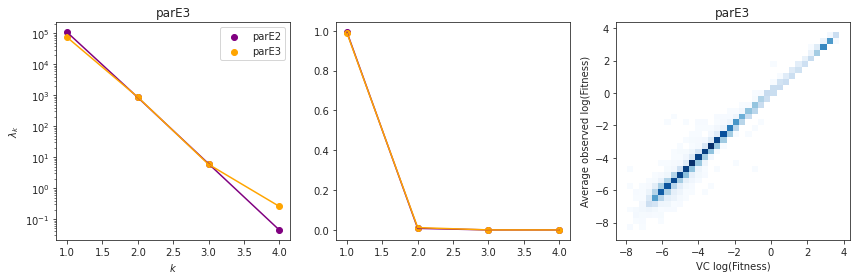

In [51]:
fig, subplots = plot.init_fig(1, 3, colsize=4, rowsize=4)

# Plot variance components
axes = subplots[0]
axes2 = subplots[1]

for c, (label, l) in zip(['purple', 'orange'], lambdas.items()):
    x = np.arange(1, l.shape[0] + 1)
    axes.scatter(x, l, c=c, label=label)
    axes.plot(x, l, c=c)
    
    p_variance = l / l.sum()
    axes2.scatter(x, p_variance, c=c, label=label)
    axes2.plot(x, p_variance, c=c)
axes.set(xlabel='$k$', ylabel='$\lambda_k$', yscale='log')
axes.legend(loc=1)

# Plot estimates vs observations
axes = subplots[2]
sns.histplot(x=pred.loc[logfitness.index, 'parE3'],
             y=logfitness['parE3_mean'], cmap='Blues', ax=axes)
axes.set(xlabel='VC log(Fitness)', ylabel='Average observed log(Fitness)', title=parE)
fig.tight_layout()

We can see that both landscapes are very additive, as the additive component explains nearly 100% of the variability in the data, with a very good correspondance between estimates and experimental measurements in general

# 2. Visualizing the protein landscape

Now that we have generated estimates of the function for every possible 3 aminoacid sequences, we can build our discrete sequences space and calculate the embedding under the specified evolutionary model

In [8]:
space = SequenceSpace(seq_length=3, alphabet_type='protein', function=pred['parE2'].values)
space.n_states, space.n_alleles, space.alphabet_type

(8000, [20, 20, 20], 'protein')

In [9]:
pred.mean(), pred.max(), pred.min()

(parE2   -3.650428
 parE3   -3.010317
 dtype: float64,
 parE2    3.854727
 parE3    3.768389
 dtype: float64,
 parE2   -7.451903
 parE3   -8.251477
 dtype: float64)

In [10]:
rw = WMWSWalk(space)

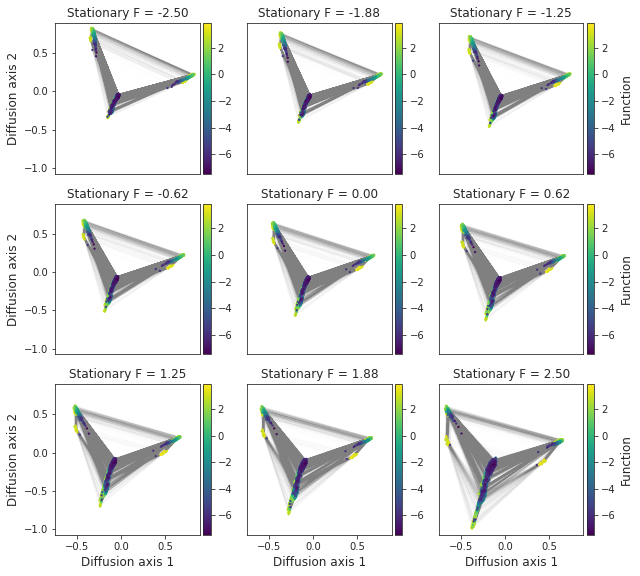

In [44]:
plot.figure_Ns_grid(rw, nodes_color='function', ncol=3, nrow=3,
                    fmin=-2.5, fmax=2.5, nodes_size=5, edges_alpha=0.02)

In [12]:
rw.calc_visualization(mean_function=2, n_components=20)
print('Mean function at stationarity of 2 was reached at Ns={:.2f}'.format(rw.Ns))

Mean function at stationarity of 2 was reached at Ns=0.73


In [13]:
nodes_df = rw.nodes_df
edges_df = rw.space.get_edges_df()

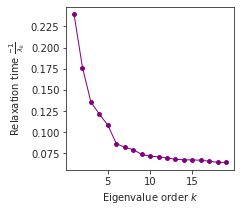

In [14]:
fig, axes = plot.init_fig(1, 1)
plot.plot_relaxation_times(rw.decay_rates_df, axes=axes)

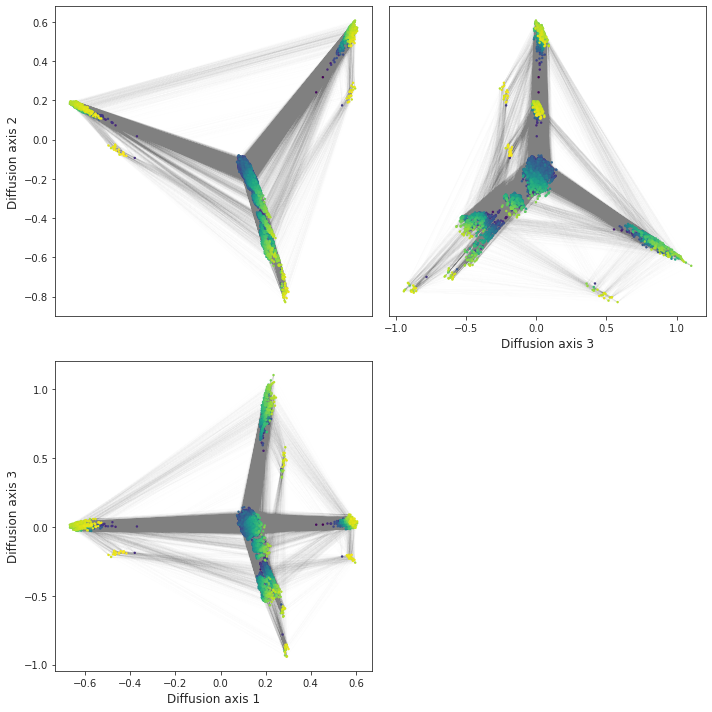

In [43]:
fig, subplots = plot.init_fig(2, 2, colsize=5, rowsize=5)


axes = subplots[0][0]
plot.plot_visualization(axes, nodes_df, nodes_color='function', edges_df=edges_df, cbar=False,
                        nodes_size=6, edges_alpha=0.01, sort_by='function', ascending=True)
axes.set(xlabel='', xticks=[])

axes = subplots[0][1]
plot.plot_visualization(axes, nodes_df, nodes_color='function', edges_df=edges_df, cbar=False, x='3',
                        nodes_size=6, edges_alpha=0.01, sort_by='function', ascending=True)
axes.set(ylabel='', yticks=[])

axes = subplots[1][0]
plot.plot_visualization(axes, nodes_df, nodes_color='function', edges_df=edges_df, cbar=False, y='3',
                        nodes_size=6, edges_alpha=0.01, sort_by='function', ascending=True)

plot.empty_axes(subplots[1][1])

fig.tight_layout()



### Allele grid

In [19]:
plot.figure_allele_grid_datashader(nodes_df, fpath='parE2.alleles', edges_df=edges_df, x='1', y='2',
                                   nodes_resolution=500)

### Interactive 3D visualization

At this scale, rendering of the edges in 3D interactive plot becomes to slow to be useful, so we can plot only the nodes to allow a faster experience

In [16]:
plot.plot_interactive(nodes_df, z='3', nodes_color='function', nodes_size=2)

Alternatively, we can select only genotypes with high fitness and plot them with the calculated coordinates as a reduced landscape

In [17]:
genotypes = (nodes_df['function'] > 1).values
fnodes_df, fedges_df = select_genotypes(nodes_df, genotypes=genotypes, edges=edges_df)

In [18]:
plot.plot_interactive(fnodes_df, edges_df=fedges_df, z='3', nodes_color='function', nodes_size=4)

Exploring the 3D landscape we can obtain a qualitative udnerstanding of the landscape. We can see that nodes are represented in a tetrahedrum-like geometry. At the base, we have have 3 broad fitness peaks characterized by having I, L, R at position 2, while the other positions can vary freely. However, if we also have K at position 3 (XIK, XLK, XRK), we move up a bit towards the tip of the tetrahedrum as fitness increases. Once K is fixed at position 3, then we move to the tip by mutating position 2 to V (XVK) or M (XMK) directly, or through less fit intermediates XMX XXK XVX.

This may be compatible with a simple additive model as reported in the paper and suggested by our VC analysis. While the highest fitness sequences are located at XIK, XLK, XRK, we still require more mutations to go from the XIX, XLX, XRX ends to the XVK end, which is what is driving the main divergence axis, together with the symmetry of the different aminoacids allowed at position 2.

If we look at the relaxation times, we can see that diffusion axis 4 and 5 still have a similar contribution to diffusion axis 3. Can we see whether XMX and XVX form similar structures in diffusion axis 4 and 5?

In [45]:
plot.plot_interactive(fnodes_df, edges_df=fedges_df, y='4', z='5', nodes_color='function', nodes_size=4)

Indeed we find now clusters corresponding to both XMX and XVX, with their corresponding subsequences XMK and XVK with improved fitness, further supporting the general idea of the additive model. It just may be that some of the alleles, and thus their combinations are slightly better than the others, such that they drive slightly more evolutionary distance and are shown in the first diffusion axis. 

The landscape may be easily summarized into an additive model with positive contributions of the following alleles, where the first position does not matter too much. 
- Position 2: I, L, R, M, V 
- Position 3: K 

TODO: fill in the details about the actual positions and have some insights into the structural requirements

# 3. Analyzing evolution using a codon model

While the evolutionary model in protein space provides helps us to understand the overal structure of the landscape from a qualitative point of view, evolution does not really take place on protein sequence directly, but on the DNA sequence encoding it. There are some aminoacid changes that are not allowed by the genetic code, while others happen much more frequently. To take these features into account, we can model evolution on nucleotide sequence using the fitnesses of the corresponding protein sequence that we have previously inferred

In [61]:
space = SequenceSpace(seq_length=3, function=pred['parE2'],
                      use_codon_model=True, codon_table='Standard',
                      stop_function=stops_logf['parE2_mean'].mean())
codon_rw = WMWSWalk(space)

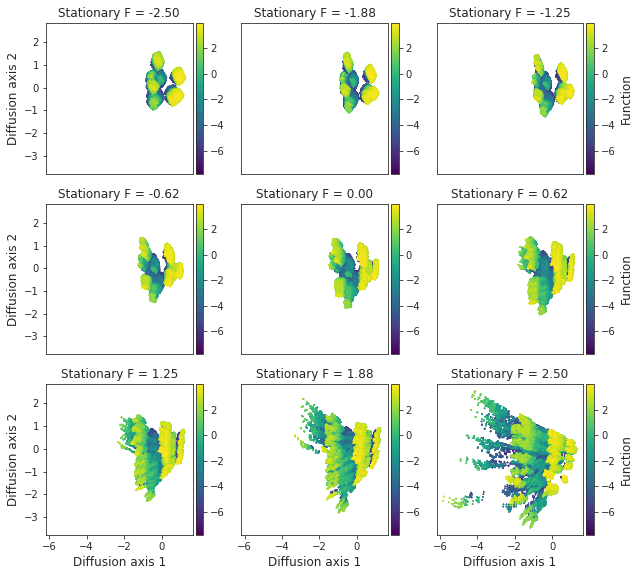

In [64]:
plot.figure_Ns_grid(codon_rw, nodes_color='function', ncol=3, nrow=3, show_edges=True,
                    fmin=-2, fmax=3, nodes_size=2, edges_alpha=0.01, ascending=True)

In [86]:
codon_rw.calc_visualization(mean_function=3, n_components=20)
nodes_df = codon_rw.nodes_df
nodes_df['protein'] = translate_seqs(nodes_df.index, codon_table='Standard')
edges_df = codon_rw.space.get_edges_df()

In [87]:
nodes_df.head()

,1,2,3,4,5,6,7,8,9,10,...,13,14,15,16,17,18,19,function,stationary_freq,protein
AAAAAAAAA,-2.651938,-0.255889,0.145842,0.599761,-1.259337,0.007892,0.564313,-1.451500,-0.102822,-0.139084,...,1.157341,-1.085541,-0.401418,-0.776669,-1.354451,-0.806927,0.087295,0.226462,4.759915e-07,KKK
AAAAAAAAC,-1.412253,0.172469,-0.110927,0.474995,-0.938625,0.055956,0.397960,-1.223882,-0.104032,-0.451639,...,0.616127,-0.523114,0.065358,-0.441030,-0.222299,0.324275,-0.253691,-4.033994,4.780713e-10,KKN
AAAAAAAAG,-2.740527,-0.320961,0.190236,0.587203,-1.260323,0.007950,0.559753,-1.449958,-0.108291,-0.244508,...,1.240285,-1.161405,-0.464862,0.191003,0.412632,1.666695,0.330988,0.226462,4.759915e-07,KKK
AAAAAAAAT,-1.412253,0.172469,-0.110927,0.474995,-0.938625,0.055956,0.397960,-1.223882,-0.104032,-0.451639,...,0.616127,-0.523114,0.065358,-0.441030,-0.222299,0.324275,-0.253691,-4.033994,4.780713e-10,KKN
AAAAAAACA,-1.341579,0.086973,-0.489957,0.432612,-0.964527,0.009221,0.395659,-1.142736,-0.168176,-0.581808,...,0.622589,-0.472957,0.178297,-0.789390,-0.661498,-0.442927,0.015222,-2.518744,5.569067e-09,KKT


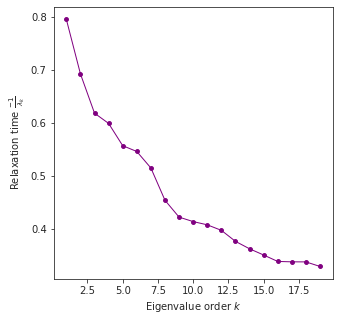

In [67]:
fig, axes = plot.init_fig(1, 1, colsize=5, rowsize=5)
plot.plot_relaxation_times(codon_rw.decay_rates_df, axes=axes)

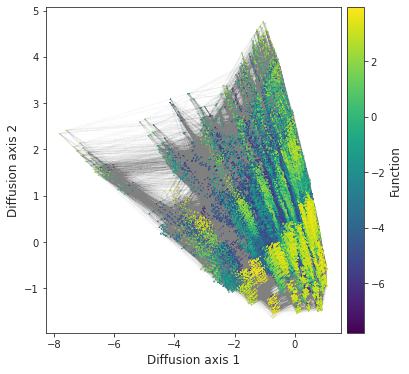

In [70]:
fig, axes = plot.init_fig(1, 1, colsize=6, rowsize=6)
plot.plot_visualization(axes, nodes_df, nodes_color='function', edges_df=edges_df,
                        nodes_size=1, edges_alpha=0.01, sort_by='function', ascending=True)


Now we can start to see how the rendering gets slower, specially as we require all the edges to be shown. To accelerate this process, we use provide some functions to do the same plots using [datashader](https://datashader.org/) library. 

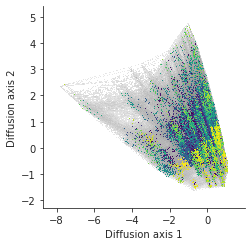

In [82]:
fig = hv.render(plot.plot_holoview(nodes_df, edges_df=edges_df, nodes_resolution=400, edges_resolution=1200))
fig

,1,2,3,4,5,6,7,8,9,10,...,12,13,14,15,16,17,18,19,function,stationary_freq
AAAAAAAAA,-2.651938,-0.255889,0.145842,0.599761,-1.259337,0.007892,0.564313,-1.451500,-0.102822,-0.139084,...,-0.036032,1.157341,-1.085541,-0.401418,-0.776669,-1.354451,-0.806927,0.087295,0.226462,4.759915e-07
AAAAAAAAC,-1.412253,0.172469,-0.110927,0.474995,-0.938625,0.055956,0.397960,-1.223882,-0.104032,-0.451639,...,-0.042897,0.616127,-0.523114,0.065358,-0.441030,-0.222299,0.324275,-0.253691,-4.033994,4.780713e-10
AAAAAAAAG,-2.740527,-0.320961,0.190236,0.587203,-1.260323,0.007950,0.559753,-1.449958,-0.108291,-0.244508,...,-0.038345,1.240285,-1.161405,-0.464862,0.191003,0.412632,1.666695,0.330988,0.226462,4.759915e-07
AAAAAAAAT,-1.412253,0.172469,-0.110927,0.474995,-0.938625,0.055956,0.397960,-1.223882,-0.104032,-0.451639,...,-0.042897,0.616127,-0.523114,0.065358,-0.441030,-0.222299,0.324275,-0.253691,-4.033994,4.780713e-10
AAAAAAACA,-1.341579,0.086973,-0.489957,0.432612,-0.964527,0.009221,0.395659,-1.142736,-0.168176,-0.581808,...,-0.051192,0.622589,-0.472957,0.178297,-0.789390,-0.661498,-0.442927,0.015222,-2.518744,5.569067e-09
